# Italian Wine Quality Analysis 

In [1255]:
# Load necessary packages
import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score

#### Red Wine

##### Load the winequality-red.csv dataset into Python as a pandas DataFrame.


In [1256]:
# load dataset
wine_red_df=pd.read_csv('winequality-red.csv',sep=';')

* read_csv() function has been used to load red wine dataset as pandas DataFrame



##### Inspect the data (number of wines, indicators and missing values).


In [1257]:
# Print first 5 rows to inspect the data
print(wine_red_df.head()) # 5 rows printed by default using head()

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  
0      9.4        5  
1      9.8        5  
2      9.8        5 


* The given data seems to provide information on various indicators of red wine including quality score, fixed and volatile acidity, citric acid level, residual sugar level, chlorides content, free and total sulfur dioxide, density, pH level, sulphates and alcohol content. All variables have numeric value in it and all except quality seems to have continuous data. Quality has discrete numerical values in it.


In [1258]:
# len() of dataset will give as number of observations in data
print("There are",len(wine_red_df),"wines in the dataset\n")

# len() of columns of dataset will give us number of variables/columns
print("Also, there are",len(wine_red_df.columns),"different indicators in the dataset:\n")
# print the columns
for i in range(len(wine_red_df.columns)):
    indicator = wine_red_df.columns[i]
    print(i+1,"-",indicator)

There are 1599 wines in the dataset

Also, there are 12 different indicators in the dataset:

1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
12 - quality


In [1259]:
# Checking for missing data in the dataset
wine_red_df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


It can be seen that there is no missing data for any indicators (columns), i.e., number of missing values in all 12 indicators is 0.


##### Exploratory data analysis, creating both numerical and graphical summaries of the data.

In [1260]:
# get numerical summary
wine_red_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000



**Numerical summary interpretation:**

- **count**: The count of observations of each wine indicator are given as 1599, and these are consistent with the total number of wines in the data we saw earlier using len(), indicating there are no missing values in the DataFrame (as we had seen earlier).

**Analysis on individual wine indicators:**

**1. Fixed acidity:**

- **mean**: The average fixed acidity is 8.32.
- **Standard deviation (std)**: ~1.74 which could mean there is moderate variation in acidity among red wine.
- **Minimum (min)**: The lowest fixed acidity is 4.6.
- **25% (25th percentile)**: 25% of the wines have fixed acidity ≤7.1.
- **50% (50th percentile/Median)**: Half of the wines have fixed acidity ≤7.9.
- **75% (75th percentile)**: 75% of the wines have fixed acidity ≤9.2.
- **Maximum (max)**: The highest fixed acidity is 15.9.

**2. Volatile acidity:**

- **mean**: The average volatile acidity is 0.53.
- **std**: ~0.18. This means some are volatile and some not. Compared with mean this could be considered a considerable deviation.
- **min**: The lowest volatile acidity is 0.12.
- **25%**: 25% of the wines have a volatile acidity ≤0.39.
- **50%**: Half of the wines have volatile acidity ≤0.52.
- **75%**: 75% of the wines have volatile acidity ≤0.64.
- **max**: Highest volatile acidity is 1.58.

**3. Citric acid:**

- **mean**: The average is 0.27 which could mean most wines have lower citric acid.
- **std**: ~0.19 – this value is high compared to mean so we can say there is high deviation.
- **min**: value of 0 which means there are wine/s that have no citric acid.
- **25%**: 25% of wines have ≤0.09 citric acid.
- **50%**: Half of the wines have ≤0.26 citric acid which is close to mean and suggests there may be a symmetric distribution.
- **75%**: 75% have ≤0.42 citric acid.
- **max**: Highest value is 1, which maybe an outlier considering mean, median and max.

**4. Residual sugar:**

- **mean**: The average value of residual sugar is 2.54.
- **std**: value of ~1.41 can be considered high deviation which means there must be varying sweetness in red wines.
- **min**: lowest value is 0.9, which must be wine/s which are least sweet.
- **25%**: 25% of the wines have ≤1.9 residual sugar.
- **50%**: 50% of the wines have 2.2.
- **75%**: 75% of red wines have ≤2.6 residual sugar. This is very close to mean suggesting the distribution may be right skewed.
- **max**: The few sweetest wines have 15.5 residual sugar, which is very high compared to mean and median suggesting again the distribution may have a longer tail on the right.

**5. Chlorides:**

- **mean**: average chloride content is 0.087.
- **std**: ~0.047 shows there is a good variation among data.
- **min**: lowest value is 0.012, which is quite low compared to mean.
- **25%**: 25% wines have ≤0.070 chloride content.
- **50%**: 50% of data have chloride content of 0.079, which is less than mean suggesting a skewness if we plot distribution.
- **75%**: 75% of the chlorides have ≤0.090.
- **max**: 0.611 is the maximum value of chloride found among red wines, which is significantly larger than mean and median. This suggests it could be an outlier and an existence of long tail towards right of the distribution when we plot chlorides.

**6. Free sulfur dioxide:**

- **mean**: Average value is 15.87.
- **std**: ~10.46 shows very high variability of free sulfur dioxide among red wines.
- **min**: Lowest value is as low as 1.
- **25%**: 25% of wines have ≤7.
- **50%**: 50% of wines have 14 which shows slight skewness as it is less than mean.
- **75%**: 75% wines have ≤21 free sulfur dioxide.
- **max**: Maximum value of 72, which is very high. Potential outlier which can affect the distribution.

**7. Total sulfur dioxide:**

- **mean**: Average is 46.47.
- **std**: ~32.9 meaning there is significant variation in total sulfur dioxide.
- **min**: Minimum value is 6.
- **25%**: 25% of wines have ≤22 total sulfur dioxide.
- **50%**: 50% have 38 as value suggesting slight skewness as it is a little less than mean.
- **75%**: 75% and therefore most wines have ≤62 value.
- **max**: Maximum is very high with value of 289 giving outlier.

**8. Density:**

- **mean**: Average value is 0.997.
- **std**: ~0.002 value can be considered as low variability.
- **min**: lightest density is 0.99.
- **25%**: 25% of wines have density ≤0.9956.
- **50%**: 50% of wines have density of 0.99675, which is sufficiently close to mean suggesting an almost symmetric distribution for density plot.
- **75%**: Density is at most 0.9978 for most wines.
- **max**: ~1.004 value for most dense wines.

**9. pH:**

- **mean**: Average value is 3.31 which is of moderate acidity.
- **std**: ~0.15 considering mean this is comparatively less showing low variation.
- **min**: minimum value of pH represents few wines which are as acidic as 2.74.
- **25%**: 25% red wines have pH ≤3.21.
- **50%**: 50% have pH value 3.31 which is same as mean suggesting distribution of data for pH is symmetrical.
- **75%**: 75% wines have pH less than or equal to 3.
- **max**: The highest pH is ~4 which are less acidic wines.

**10. Sulphates:**

- **mean**: Average is 0.66.
- **std**: ~0.17 suggesting there must be moderate variability of sulphate content among red wines.
- **min**: Minimum sulphate content observed among all red wines is 0.33.
- **25%**: 25% of red wines have sulphates ≤0.55.
- **50%**: 50% has 0.62.
- **75%**: 75% has at most value of 0.73.
- **max**: Maximum value is 2 which is a potential outlier.

**11. Alcohol:**

- **mean**: Average alcohol content is 10.42.
- **std**: ~standard deviation of ~1.07 shows moderate variability in alcohol content among red wines.
- **min**: Lowest alcohol content is 8.4.
- **25%**: 25% of wines have ≤9.5 alcohol.
- **50%**: 50% have 10.2, which is very close to mean, still with slight skewness.
- **75%**: 75% red wines have alcohol value ≤11.1.
- **max**: Highest alcohol content observed among red wines is 14.9.

**12. Quality:**

- **mean**: Average is 5.64, which means most wines are of mid-quality around a score of 5.
- **std**: ~Value of 0.81 can be considered as of less variability.
- **min**: Lowest quality score among red wine data is 3, so scores from 0-2 did not appear for any wine.
- **25%**: 25% of wines have a quality score ≤5.
- **50%**: Median quality score is 6.
- **75%**: For most wines, quality score is less than or equal to 6.
- **max**: Highest score is 8 among red wine data, so no wines achieved a score of 9 and 10 as per scale.
- We can see that except meaan and standard deviation, all other metrics are discrete as quality is discrete data.


All except quality (i.e., 11 indicators) has been plotted using histograms as shown below in Fig 1. For quality, since it is dicrete data, barchart has been used as shown in Fig 2.


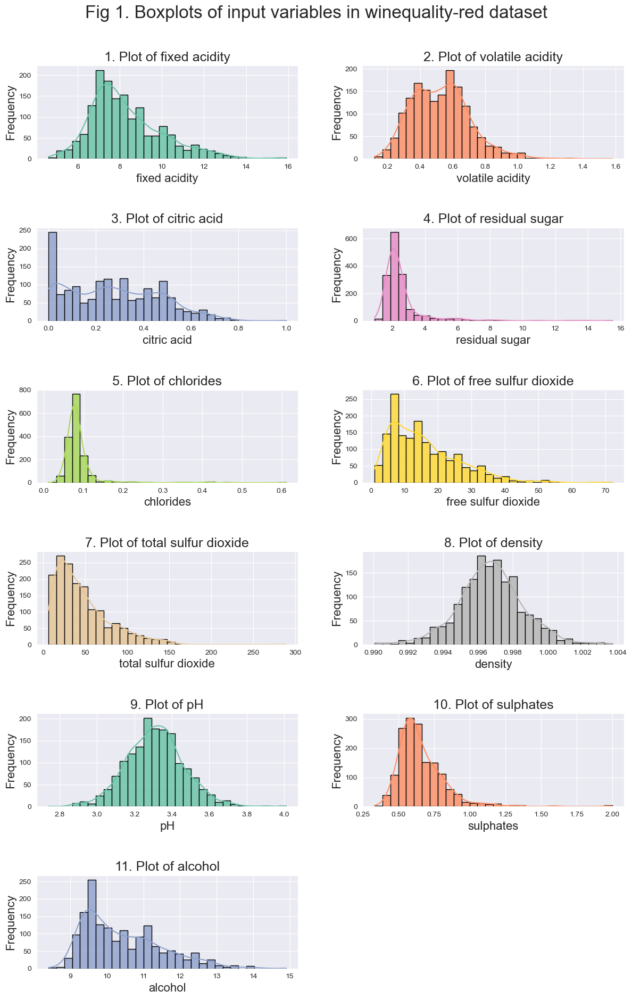

In [1261]:
# set plot size
plt.figure(figsize=(12, 18))

# set background grid style
sns.set_style("darkgrid")
# get colors to plot
colors = sns.color_palette("Set2", 12)

# create plot for each indicators by looping through. Quality not considered as it is discrete.
for i in range(len(wine_red_df.columns[:-1])):
    # get variable name from column index i
    indicator = wine_red_df.columns[i]
    # dynamically plot using subplot and loop variable i
    plt.subplot(6,2,1+i)
    # create histogram (using 30 bins) of variable against frequency
    sns.histplot(wine_red_df[indicator], color=colors[i], kde=True, bins=30, 
                 alpha=0.8, edgecolor='black', linewidth=1)
    plt.ylabel('Frequency', size=16)
    plt.xlabel(f'{indicator}', size=16)
    plt.title(f'{i+1}. Plot of {indicator}', size=18)  

# Provide appropriate spacing and main title
plt.tight_layout(h_pad=4, w_pad=4)
plt.suptitle('Fig 1. Boxplots of input variables in winequality-red dataset', 
             y=1.04, size=24)
plt.show()


**Graphical summary observations (Fig 1.):**

**1. Fixed acidity:**

* The plot shows the distribution is between range 4.6 and 15.9 as also shown in numerical summary.
* The distribution of fixed acidity readings is slightly right-skewed. This is as seen in numerical summary since mean (8.32) is slightly more but close to the median (7.9).
* The right skewness could also be predicted from numericla summary due to maximm value being 15.9 which is quite far from 75th percentile.

**2. Volatile acidity:**

* The graph is slightly right skewed, which aligns with our findings in numerical summary that mean (0.53) is slightly higher than the median (0.52).
* There is a long tail on the right which was also evident from numerical summary (max value 1.58 is considerably higher than the 75th percentile 0.64). This seems like an outlier.

**3. Citric acid:**

* This distrubution is also right-skewed. 
* The minimum value was 0 and this can been seen in graph as well that many values are present around 0.
* Here also, there is a longer tail towards the right as the max value of 1 is significantly higher than the 75th percentile (0.42).

**4. Residual sugar:**

* There is right skewness which was also evident from nuemerical summary (mean 2.54 is greater than the median 2.20).
* There is a long right tail as we had expected earlier due to maximum value (15.5) being very high compared to mean and median.
* This seems to be an outlier that is affecting the distribution overall.

**5. Chlorides:**

* The distribution is a bit similar to that of residual sugar with range of 0.012 to 0.611.
* There seems to be few extreme outliers.
* Mean and median values are very small and this can be seen in graph (there are many values distributed near 0).

**6. Free sulfur dioxide:**

* The distribution is again right skewed with mean (15.87) being greater than median (!4).
* Graph shows wide range as suggested by numerical summary (1to 72).
* The skewness is in line with our findings that the maximum value (72) is very high compared to 75th percentile (21).

**7. Total sulfur dioxide:**

* One of the most right skewed distrubutions with range of values bwteen 6 and 289.
* This skewness was also suggested by numerical summary (mean value of 46.47 is greater than the median valeue of 38).
* There is a long tail also showing a very high maximum (from numerical summary this value is 289 and this value is much higher than the 75th percentile value of 62).

**8. Density:**

* As mentioned in numerical summary, we can see plot of density has an almost symmetric distribution with mean being same as median (~0.996).
* Also, there range of values is small supporting symmetrical distribution in plot.

**9. pH:**

* Here alos, we can see an almost symmetrical distribution, which is as expected from numerical summary result, i.e., we had seen mean is same as median (3.31).
* It is not very clear if there are significant outliers based on the plot or numerical summary.

**0. Sulphates:**

* We can see a slight right-skewness. In numerical summary, we can see mean  (0.66) is slightly greater than median (0.62) supporting the plot shape. 
* Also we had seen the maximum is high (value of 2) compared to the small mean and median. This is represented by long tail in the histogram.

**11. Alcohol:**

* Like most variables we had seen so far, alcohol's distribution also looks right skewed with range 8.4 to 14.9.
* Mean (10.42) is again greater than the median (10.2).
* The maximum value is very high compared to 75th percentile (~11), and this can be witnessed from the long tail of the plot.


Fig 2. shows a barchart of quality indicator (discrete data):


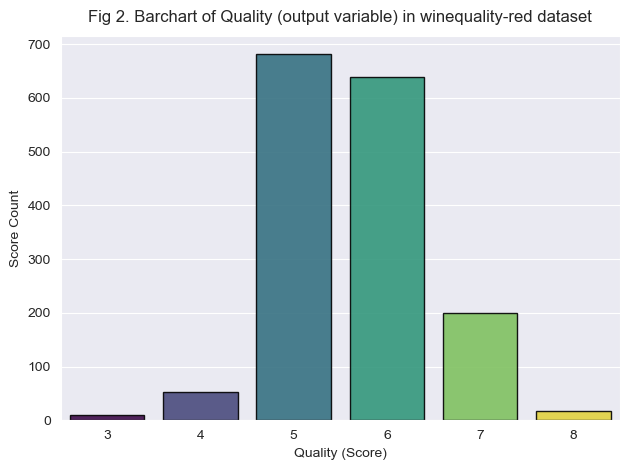

In [1262]:
# plot barplot using countplot() function from seaborn package.
sns.countplot(x='quality', data=wine_red_df, palette='viridis', 
              hue='quality',alpha=0.9, legend=False, edgecolor='black')

plt.title('Fig 2. Barchart of Quality (output variable) in winequality-red dataset', pad=10, size=12)
plt.ylabel('Score Count')
plt.xlabel('Quality (Score)')
plt.tight_layout()
plt.show()


**Graphical summary observations (Fig 2.):**

* The peak count of quality scores is achieved at a score of 5, followed by score 6. The maximums score achieved by a wine is 8 from a scale of 0 to 10 as we saw in numerical summary. Also minimum value is 3.


#### White Wine

##### Load the winequality-white.csv dataset into Python as a pandas DataFrame.


In [1263]:
# load white wine dataset
wine_white_df=pd.read_csv('winequality-white.csv', sep=";")


##### Inspect the data (number of wines, indicators and missing values).


In [1264]:
# print first 5 rows of white wine
print(wine_white_df.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9951  3.26       0.44   
3                 47.0                 186.0   0.9956  3.19       0.40   
4                 47.0                 186.0   0.9956  3.19       0.40   

   alcohol  quality  
0      8.8        6  
1      9.5        6  
2     10.1        6 


* Similar to red wine dataset, the given data again seems to provide information on various indicators of white wine including quality score.Here also, all variables have numeric values and all except quality seems to have continuous data. Quality has discrete numerical values in it.


In [1265]:
# Get lenght of dataset again
print("There are",len(wine_white_df),"wines in the dataset\n")

# get variable names
print("Also, there are",len(wine_white_df.columns),"different indicators in the dataset:\n")
for i in range(len(wine_white_df.columns)):
    indicator = wine_white_df.columns[i]
    print(i+1,"-",indicator)

There are 4898 wines in the dataset

Also, there are 12 different indicators in the dataset:

1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
12 - quality



* It can be be seen that both datasets have same input indicators (displayed above).We can also check this using following code:


In [1266]:
wine_white_df.columns.equals(wine_red_df.columns)

True


* This once again confirms the 2 dataset have same variables. However, white wine dataset has much more data (wine observations) of 4898 compared to details of 1599 wines in red wine dataset.



##### Perform a t-test, for each of the measurements, to test whether any of the indicators differ between the red and the white groups (significance level α= 0.01).



* Here, we are going to perform t test for each indicator between the two datasets. For our hypothesis testing: 
    * null hypothesis will be that there is no difference in indicator between 2 datasets.
    * alternative hypothesis will be that there is difference in indicator between the two.
    

In [1267]:
# create dataframe to store results to print output neatly
Result_df=pd.DataFrame(columns=['Indicator','t-statistic','p-value', 'Decision'])

# loop through all variables to get t statistic and p values
for i in range(len(wine_red_df.columns)):
    # get variable name to extract values from dataset
    indicator = wine_white_df.columns[i]
    # get t statistic value using ttest_ind() from scipy.stats module
    # equal_var=False set for unequal variances
    t_statistic = stats.ttest_ind(wine_red_df[indicator], 
                wine_white_df[indicator],equal_var=False).statistic
    # the test also gived p, value
    p_value = stats.ttest_ind(wine_red_df[indicator], 
                wine_white_df[indicator],equal_var=False).pvalue

    #if p value less than alpha reject, else fail to reject null hypothesis.
    if(p_value<0.01):
        decision='Reject Null Hypothesis'
    else:
        decision='Fail to reject Null Hypothesis'

    Result_df.loc[i+1] = [indicator, t_statistic, p_value, decision]

Result_df

,Indicator,t-statistic,p-value,Decision
1,fixed acidity,32.422711,5.668161e-183,Reject Null Hypothesis
2,volatile acidity,53.059093,0.000000e+00,Reject Null Hypothesis
3,citric acid,-12.228986,3.172970e-33,Reject Null Hypothesis
4,residual sugar,-47.802237,0.000000e+00,Reject Null Hypothesis
5,chlorides,34.240211,6.094754e-199,Reject Null Hypothesis
6,free sulfur dioxide,-54.427948,0.000000e+00,Reject Null Hypothesis
7,total sulfur dioxide,-89.872059,0.000000e+00,Reject Null Hypothesis
8,density,42.708511,0.000000e+00,Reject Null Hypothesis
9,pH,27.775497,2.342265e-149,Reject Null Hypothesis
10,sulphates,37.055905,1.678842e-231,Reject Null Hypothesis



* From the result we observe that for all variables, we reject null hypothesis i.e., the p value turned out to be less than the given significance level of 0.01 for all indicators. The p-value indicates the probability of seeing the data when the null hypothesis is actually true and this value is very small in our case.
* Therefore, we conclude that there is significant difference in all 12 variables between red and white wines.
* Note: We can also use t-statistic to obtain these results by comparing t value to critical value.


##### Compare the two data sets using appropriate graphical means.

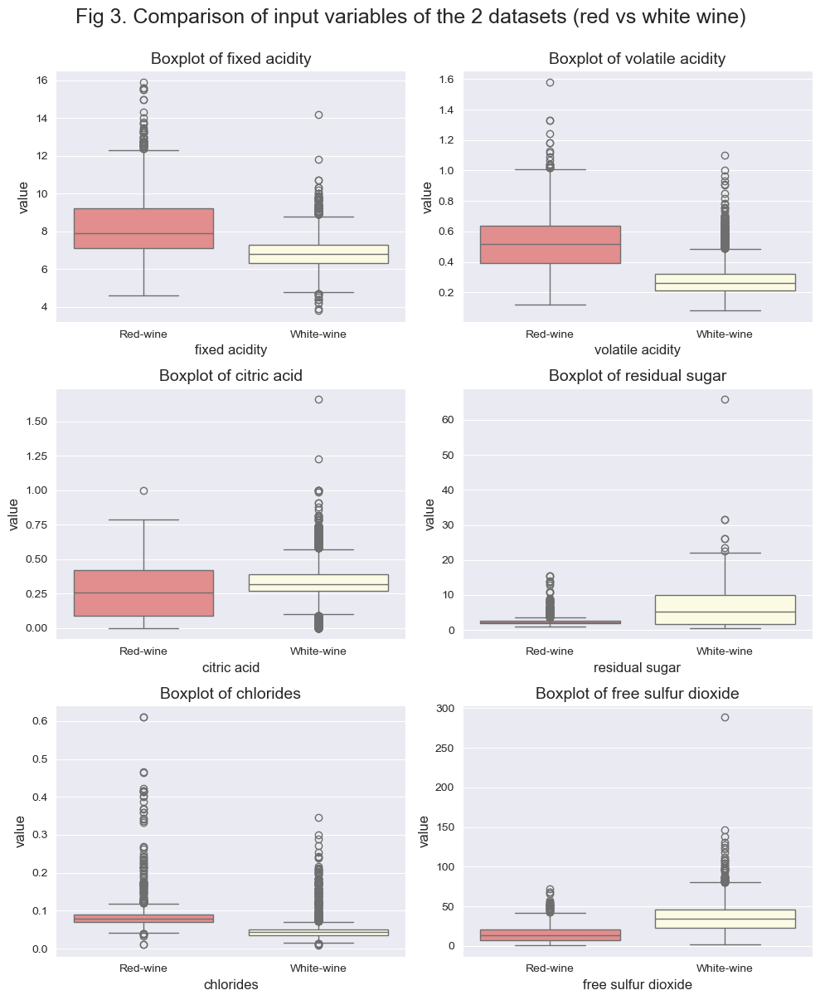

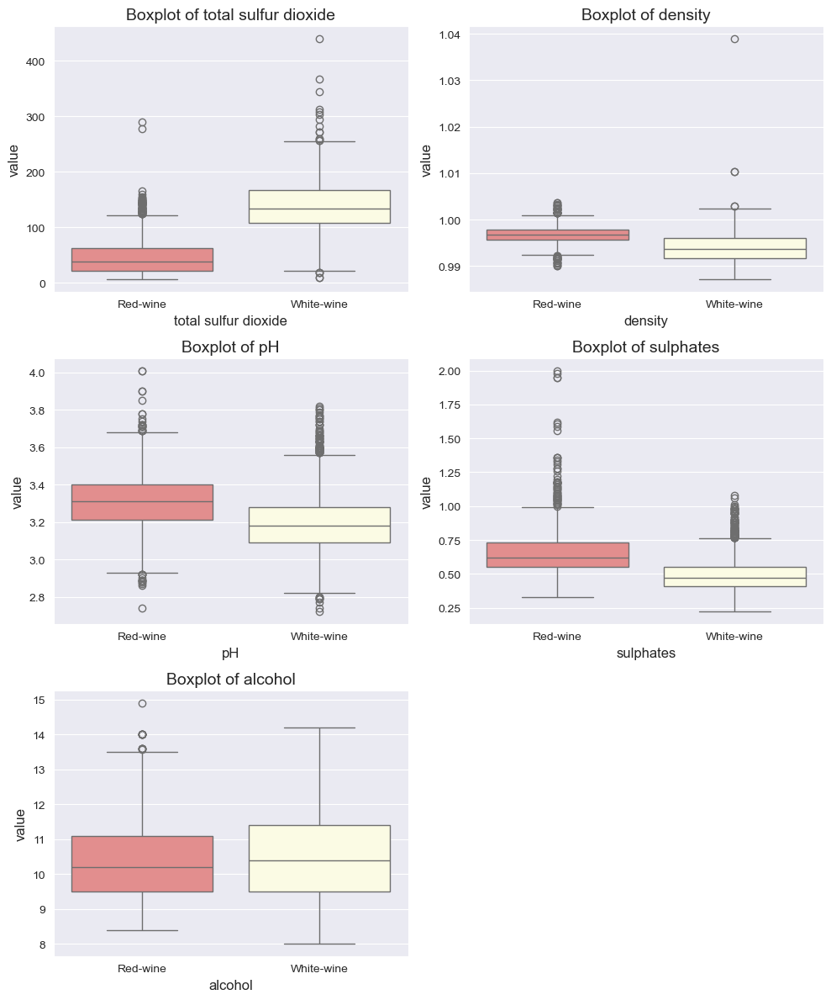

In [1268]:
plt.figure(figsize=(10, 12))
plt.suptitle('Fig 3. Comparison of input variables of the 2 datasets (red vs white wine)', y=1, fontsize=18)

i=1 #subplot index for dynamic plotting

# loop through continuous variables in red wines dataset except quality
for j in range(len(wine_red_df.columns[:-1])):
    # get corresponding indicator from white wine dataset
    indicator=wine_white_df.columns[j]
    # do not plot more than 6 plots in a single figure
    if i > 6: 
        plt.figure(figsize=(10, 12))
        i=1
    
    # code to plot boxplot using seaborn's method
    plt.subplot(3,2,i)
    sns.boxplot(data=pd.DataFrame({'Red-wine': wine_red_df[indicator],
                'White-wine': wine_white_df[indicator]}),palette=["lightcoral", "lightyellow"])
    plt.ylabel('value', fontsize=12)
    plt.xlabel(indicator, fontsize=12)
    plt.title(f'Boxplot of {indicator}', fontsize=14)
    plt.tight_layout()
    i=i+1


plt.show()


**Comparison of the red and white wine datasets (Fig 3.):**

**1. Fixed acidity:**

* The variability in fixed acidity in the middle 50% of data seems to be more for red wine. For white wine it is less.
* Red wine seems to have higher median than white wine.
* Both wines seems to have a lot of outliers above upper quartile wiht red wine's outliers more extreme.

**2. Volatile acidity:**

* The size of the box of red wine is wider here as well, compared to white wine showing more variation in the middle 50% of data.
* Red wine has a higher median volatile acidity than white wine,.
* Overall, white wine has much lower volatile acidity.

**3. Citric acid:**

* The longer whisker for red wine boxpot shows more assymetric distribution of data compared to white wine.
* White wine has a slightly higher median citric acid compared to red wine.
* Red wine again has much more variability in the middle 50% of data.
* Overall, red wine has more citric acid content.

**4. Residual sugar:**

* White wine has much larger median than red wine.
* The variation in middle 50% data in case of residual sugar is more for white wine.
* The box representing red wine is very narrow, which means it has much less variations in middle 50% of data.
* Both have outliers, but white wine has them at more extreme ends.
* Overall, white wine seems to be more sweet with more residual sugar.

**5. Chlorides:**

* White wine has lesser median than red wine.
* The box size is almost same showing both wines have similar variations within middle 50% data.
* Presence out outliers above upper whisker in both show skewness in both towards right.

**6. Free sulfur dioxide:**

* White wine has a higher median than red wine.
* The box size is a bit more for white wine showing more variations in the middle 50% dtaa.
* White wine has more extreme values out free sulfur dioxide as seen from extreme outliers.
* The upper longer whisker for red wine suggests the distribution is assymmetrical in case of red wine compared to more symmetrical middle 50% of white wine.
* Overall, white wine whine seems to contain more free sulfur dioxide.

**7. Total sulfur dioxide:**

* The trend in free sulfur dioxide is followed here as well.
* Here, white wine has much higher median than red wine.
* The range of values is also more with extreme outliers for white wine.
* The size of the box for white wine suggests more variation in total sulfur dioxide in middle 50% of data.

**8. Density:**

* Red wine seems to have slightly higher median value but range of density values is small compared to white wine.
* Extreme outliers are observed for white wines showing more denser wines to have occured in case of white wine.
* Overall trend suggests white wines dataset consist of details about more denser wines.

**9. pH:**

* White wine has lesser median pH compared to red wine showing that it has more acidic values at 50%.
* White wines have more outliers at lower end and red has more outliers at upper end.
* This again shows white wines consist of more acidic wines than red wine.
* The size of the boxes in case of two wines are comparable, showing similar variations in middle 50% of data.

**10. Sulphates:**

* Red wine has higher median, higher range and much extreme outliers compared to white wine.
* The variability in data in the middle is alos slightly higher for red wines.
* Overall, red wines seems to have more suplhate content in general.

**11. Alcohol:**

* White wine has slightly higher median than red wine.
* The distribution for both wines shows it is a little assymmetric in a simialr way.
* White wine has more variations in the middle 50% data.
* The range of alcohol values is higher in white wines, although some extreme high values seems to have occured in case of red wines.   

<Figure size 1500x1000 with 0 Axes>

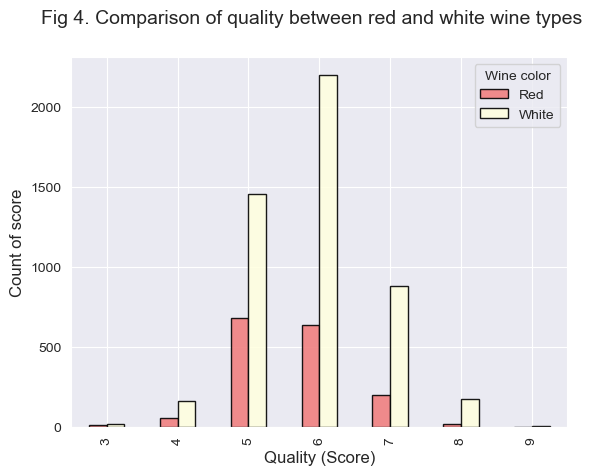

In [1269]:
plt.figure(figsize=(15, 10))

#create a dataframe for plotting based on wine color labelling
quality_combined_df = pd.DataFrame({'Red': wine_red_df['quality'].value_counts().sort_index(),
    'White': wine_white_df['quality'].value_counts().sort_index()})

# plot barplot using kind='bar'
quality_combined_df.plot(kind='bar', color=['lightcoral', 'lightyellow'],alpha=0.9, 
                         edgecolor='black', linewidth=1)

plt.suptitle('Fig 4. Comparison of quality between red and white wine types', fontsize=14)
plt.ylabel('Count of score', fontsize=12)
plt.xlabel('Quality (Score)', fontsize=12)
plt.legend(title='Wine color', loc='upper right')

plt.show()


**Graphical summary observations (Fig 4.):**

* We can see that unlike red wine, for white wine the most frequent score is 6. We can also see a max of 9 score appearing for very rare number of white wines. Overall count is more, which is expected as the number of observations in white wine dataset is more. The second most occuring score is 5. For both datasets, minimum score is 3. Overall, white wine shows higher quality levels.


#### Combined dataset

##### Combine the two datasets into a single DataFrame.

In [1270]:
# combine datasets using pandas method concat(). Ignore index to avoid errors when combining.
wine_combined_df = pd.concat([wine_red_df, wine_white_df], ignore_index=True)

# verify length of combine dataset
len(wine_combined_df)

6497

* As it can be seen a total of 6497 wines are included in the combined data set. The white wine dataset has been added below red wine dataset.

#####  Compute the Pearson correlation coefficient between each of the measurements and identify which indicators are most correlated.

In [1271]:
# initialise list to store pearson correlation coefficient of each indicator pairs
pearson_corr =[]

# loop through 2 variables/indicators
for i in range(len(wine_combined_df.columns )):
    for j in range(i + 1, len(wine_combined_df.columns)): # avoid repetition of pairs
        indicator1 = wine_combined_df.columns [i]
        indicator2 = wine_combined_df.columns [j]
        # use pearson2() from scipy.stats module to compute correlation coefficient
        corr_coefficient = pearsonr(wine_combined_df[indicator1], 
                                    wine_combined_df[indicator2]).statistic
            # add to the list for displaying later
        pearson_corr.append((indicator1, indicator2, corr_coefficient))

pearson_corr_df = pd.DataFrame(pearson_corr, columns=['Indicator1', 'Indicator2', 'Pearson correlation coefficient'])
pearson_corr_df['Absolute Pearson correlation coefficient'] = pearson_corr_df['Pearson correlation coefficient'].abs()
top4_corr_pairs = pearson_corr_df.sort_values(by='Absolute Pearson correlation coefficient', ascending=False).head(4)
top4_corr_pairs

,Indicator1,Indicator2,Pearson correlation coefficient,Absolute Pearson correlation coefficient
45,free sulfur dioxide,total sulfur dioxide,0.720934,0.720934
58,density,alcohol,-0.686745,0.686745
33,residual sugar,density,0.552517,0.552517
32,residual sugar,total sulfur dioxide,0.495482,0.495482



* We can see that the strongest correlation (positive correlation) is observed between free sulfur dioxide and total sulfur dioxide (pearson correlation coeffienct of ~0.721) 
* This is followed by negative correlation between alcohol and density (~-0.69). 
* The higher the absolute pearson correlation coefficient, more the correlation between variables. 
* The sign will tell us if it is a positive or a negative correlation.
* The 3rd most correlated pair is residual sugar and density (~0.55), followed by followed by residual sugar and total sulfur dioxide (~0.49). 
* It was noticed that the top most correlated pairs have appearance of same variables repeatedly showing high correlation in between themselves.


#####  Create scatter plots for the each of the correlated pairs identified.

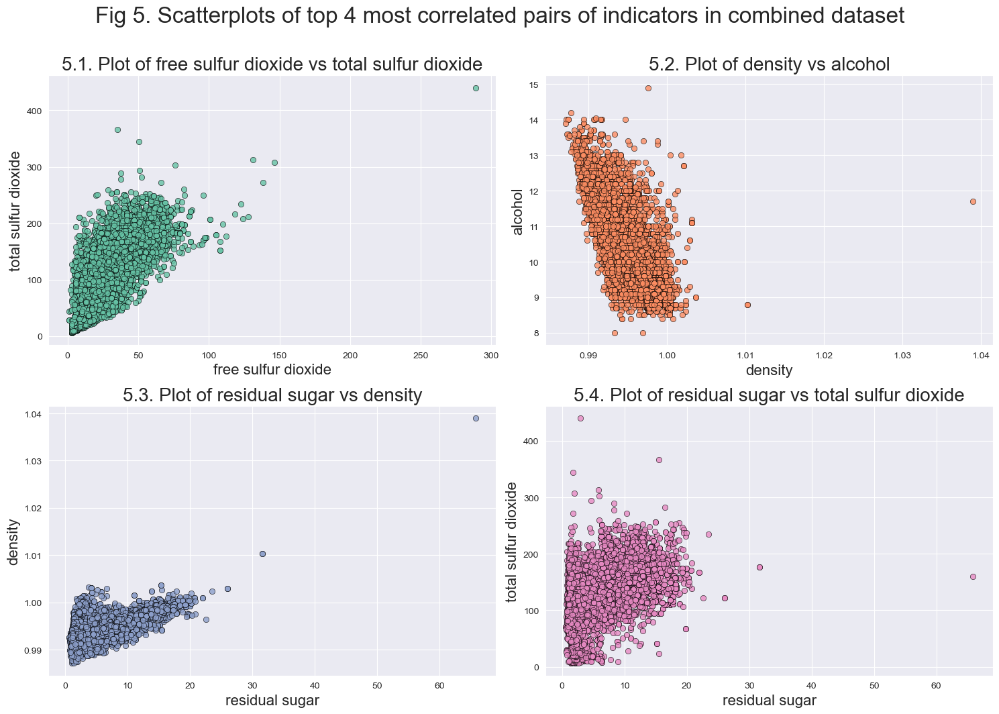

In [1272]:
plt.figure(figsize=(15, 10))
colors = sns.color_palette("Set2", 4)

#create lists to loop through
Indicator1_list = top4_corr_pairs['Indicator1'].tolist()
Indicator2_list = top4_corr_pairs['Indicator2'].tolist()

i = 0 # subplot index
for Indicator1 in Indicator1_list:
    # get corresponding pair from list
    Indicator2 = Indicator2_list[i]
    # give subplot position
    plt.subplot(2,2,i+1) 
    # create scatter plot of each pair
    sns.scatterplot(x=wine_combined_df[Indicator1], y=wine_combined_df[Indicator2], 
                    color=colors[i], alpha=0.8, edgecolor='black')
    plt.title(f'5.{i+1}. Plot of {Indicator1} vs {Indicator2}', size=20)
    plt.xlabel(Indicator1, size=16)
    plt.ylabel(Indicator2, size=16)
    i+=1

plt.tight_layout()
plt.suptitle('Fig 5. Scatterplots of top 4 most correlated pairs of indicators in combined dataset', y=1.06, fontsize=24)
plt.show()




**Observations (Fig 5.):**

* As expected, the plot of total sulfur dioxide and free sulfur dioxide (subplot 5.1) has the highest slope (which is positive as well) showing strongest positive correlation between the two. The slopes of all plots except between alcohol and density are positive, which meaans as one variable increases, other increases too.
* Scatter plot between density and alcohol (subplot 5.2) shows high negative correlation which means that as one variable increases, other decreases. This is as expected from our previous result, where we had seen pearson coefficient between alcohol and density was a negative value high in magnitude (approx. -0.69).
* The amount of slope also follows the order we observed before. The plots of residual sugar (subplots 5.3 and 5.4) have comparable slopes which show moderate correlation. 
* However, plot of residual sugar against density (subplot 5.3) have a stronger alignment with points being more concentrated in a positive direction compared to plot against total sulfur dioxide (subplot 5.4) which has more spread along other diections. Overall, in both cases we can observe an upward slope.
* Least slope among these top 4 correlation pairs is observed in the plot between residual sugar and total sulfur dioxide. This least slope among the 4 pairs aligns with our observation when we found correlation coefficients.
* If there was no correlation, the points would have been more scattered and changes in one variable would not affect other.
* Hence, the result is as expected from the pearson correlation coefficients.

#### Linear regression to predict wine quality.
(Wine quality scores as dependent variable)

#####  We consider wine with a quality score from 0 to 5 as being POOR, while quality scores from 6-10 are considered GOOD. Create a new column in the dataframe indicating whether the wine is POOR or GOOD.

In [1273]:
# create a copy to modify
wine_combined_df_modified = wine_combined_df.copy()

# add a new column to label as POOR or GOOD based on quality
wine_combined_df_modified['quality class'] = wine_combined_df_modified['quality'].apply(
    lambda x:'POOR' if x <= 5 else 'GOOD')

# print few rows to view changes
wine_combined_df_modified.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality class
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,POOR
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,POOR
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,POOR
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,GOOD
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,POOR


##### Separate the data into response and predictor variables and standardise the predictor variables.

In [1274]:
# create predictor variables
X_raw = wine_combined_df_modified.drop(['quality','quality class'],axis=1)
# standardise predictor variables
X_std = (X_raw-X_raw.mean())/X_raw.std()

# create response variable
y = wine_combined_df_modified.quality

##### Fit a linear regression model and interpret the fitted model.

In [1275]:
# add intercept term to use OLS function
X_std.insert(0,'intercept',1)

# use ols function from api module to fit linear regression in statsmodel
mod = sm.OLS(y,X_std)
res = mod.fit()
# Get summary of fitted model
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     243.3
Date:                Mon, 02 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:29:50   Log-Likelihood:                -7215.5
No. Observations:                6497   AIC:                         1.445e+04
Df Residuals:                    6485   BIC:                         1.454e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
intercept                5.8184 

**Interpretation:**

* The p values for most of the indicators are very close to 0, showing they are important variables that can affect wine quality.
* Citric acid (0.168) and chlorides (0.146) have high p-values. This means these are not very important variables to predict wine quality in say 95% confidence interval (p vale>alpha 0.05).
* Fixed acidity, residual sugar, free sulfur dioxide, pH and sulphates have positive coefficents (beta values) which means an increase in ints value will result in increase in wine quality
* Remaining indicators such as volatile acidity, citric acid, chlorides, total sulfur dioxide and density have negative coefficients which mean an increase in these indicator values will result in a decrease in wine quality.
* Volatile acidity has largest coefficient which is negative (-0.2186), so an increase in this indicator value will reduce wine quality the most.
* Similarly residual sugar has highest positive coefficient (0.2072), which means an increase in its value will increase wine quality more than other indicators.
* In this model all 11 indicators (predictor variables) are used to predict wine quality (response variable).
* R-squared and adjusted R- squared values of ~0.29 show that the model explains only 29.2% of the changes in wine quality. This means that the model (ie individual variables) and there maybe other important indicators not included in the model (underfitting).
* The F statistic is quite high (243.3) and probability value of 0 shows that even though individual indicators do not explain the model well, as a whole it is significant i.e.

##### Perform forward selection for the regression model using the Akaike Information Criterion (AIC).

In [1276]:
def forward_aic(y, X):
    all_indicators = X.columns.tolist()

    #remove intercept from indicators list
    if 'intercept' in all_indicators:
        all_indicators.remove('intercept')

     # initialize empty list of indicators
    selected_variables = []

    # better aic is lowest aic so initialize with infinity
    aic_best = float('inf')

    #initialize final model to be returned
    final_model = None
    
    while True: #loop is ended by break statment
        variables_aic_map = {}

        # Add new variable each time in loop:
        for i in all_indicators:
            X_new = [i] + selected_variables
            # include intercept again for fixing model
            X_new_with_const = X[['intercept'] + X_new]
            # Fit linear regression model
            model = sm.OLS(y, X_new_with_const).fit()
            variables_aic_map[i] = model.aic # add aic value to list

        # check if no more variables to be added    
        if not variables_aic_map:
            break

        # else check current miminim
        current_best_variables = min(variables_aic_map,key=variables_aic_map.get)
        current_aic = variables_aic_map[current_best_variables] 

        # End the loop if aic is not getting improved
        if current_aic >= aic_best:
            break
        
        # else go ahead to next 'while' loop after fitting new model
        selected_variables.append(current_best_variables)
        aic_best = current_aic
        
        # Fit the model with new set of indicators
        final_model = sm.OLS(y, X[['intercept'] + selected_variables]).fit()
    
    return final_model, selected_variables


# call function to perform forward aic and get model with selected variables
forward_aic_model, selected_variables = forward_aic(y, X_std)

print(forward_aic_model.summary())

removed_variables = [i for i in X_std.columns if i != 'intercept' and i not in selected_variables]

print("\nFeatures removed compared to model in (b)",removed_variables)



                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     267.4
Date:                Mon, 02 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:29:51   Log-Likelihood:                -7216.4
No. Observations:                6497   AIC:                         1.445e+04
Df Residuals:                    6486   BIC:                         1.453e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
intercept                5.8184 

**Interpretation:**

* In this new model selected by forward aic, we can see that Citric acid indicator is not included in this model.
* However, both models still have the **same R-squared and adjusted R-squared** values (~0.292).
* When we compare **aic and bic** of both modes, we can see that these values are also same.
* This shows that removing citric acid as predictor variable did not affect the model much, i.e., its ability to explain changes in wine quality.
* This is also evident in model from (b) using all indicators, i.e, from p value for citric adic which is very high (0.168). 
* Therefore, **citric acid doesn't have much effect on wine quality**.
* The **F statistic** for this new model is a bit higher (267.4) compared to the model in (b) which had F statistic value of 243.3.
* This means as a whole prediction improved slightly as we have one less predictor (of less importance).
* Other coefficients have p values close to 0 except chlorides with 0.09 in this new model.
* This shows that chlorides are the least significant indicator in this new model with no significance at 95% confidence interval (because the value is >0.05 alpha).

#### Random forest regression to predict the quality of a wine.
(Remaining indicators as predictor variables.)

##### Split the data into appropriate training and test sets.

* We will split the wine data into training and test sets such that around 75% of the data will be used for training purposes and the remaining roughly around 25% for the test data.
* Hence, we will use 4877 shuffled wine observations for training data.
* Remaining 1620 wine observations will be used for test data.

In [1277]:
# Get X values (non  standardised), by dropping response variabel quality.
X = wine_combined_df.drop(['quality'],axis=1)
# Get response variable directly from wine dataframe as series (it is only one column)
y = Series(wine_combined_df.quality)

# declare train size
train_size = 4877
# use seed to get same random output in next stp
np.random.seed(123)
# Get shuffled indexes, number of index = number of observations = len(y)
train_select = np.random.permutation(range(len(y)))

# take first 4877 indices from shuffled 'train_select' set to get predictors and response data for training
X_train = X.iloc[train_select[:train_size],:].reset_index(drop=True)
y_train = y[train_select[:train_size]].reset_index(drop=True)
# remaining 1620 indices from shuffled set to get predictors and response data for testing
X_test = X.iloc[train_select[train_size:],:].reset_index(drop=True)
y_test = y[train_select[train_size:]].reset_index(drop=True)


##### Fit a random forest regression model with 10 trees using the training data (random_state=101 to ensure reproducible results). Determine which variables are most important in predicting the quality of a wine.

In [1278]:
# n_estimators set for number of trees as 10, random_state to generate same results
# use method from sklearn.ensemble module for the model
rf = RandomForestRegressor(n_estimators=10, random_state=101)
# use training set to train the model
rf.fit(X_train, y_train)

# use feature_importances_ metric to check most important variables and order in descending order.
variable_importance_table = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

# print result
print("Variable importance in descending order:\n", variable_importance_table)


Variable importance in descending order:
 alcohol                 0.252067
volatile acidity        0.129252
free sulfur dioxide     0.090091
residual sugar          0.074662
total sulfur dioxide    0.074317
pH                      0.073438
sulphates               0.071652
chlorides               0.064608
citric acid             0.059591
density                 0.056116
fixed acidity           0.054207
dtype: float64


* According to this model fitting, alcohol is the most important variable (it is at top of the table) with feature importance metric value of 0.252.

##### Use the random forest regression model to predict the quality of a wine for the test set. Create a scatter plot of the true quality versus the predicted one.

* We will use the mean sums of squares (mse) value to check how well the model performs. It is a measure of the discrepancy between the data and an estimation model. Hence smaller value is desirable.

In [1279]:
# use test set for prediction
rf_test_pred = rf.predict(X_test)
# check difference between predicted and actual values of responses
RSS_rf = np.mean(pow((rf_test_pred- y_test),2))
print(RSS_rf)

0.4196481481481481


* Therefore the mean RSS (residual sum of squares)/mse value is around 0.42. This means the possible error for each prediction in wine quality scores from is bounded by this range.
* Since quality score is a discrete data from 0 to 10, this value cannot be considered small. The model can be said to be able to make only somewhat reasonable predictions.

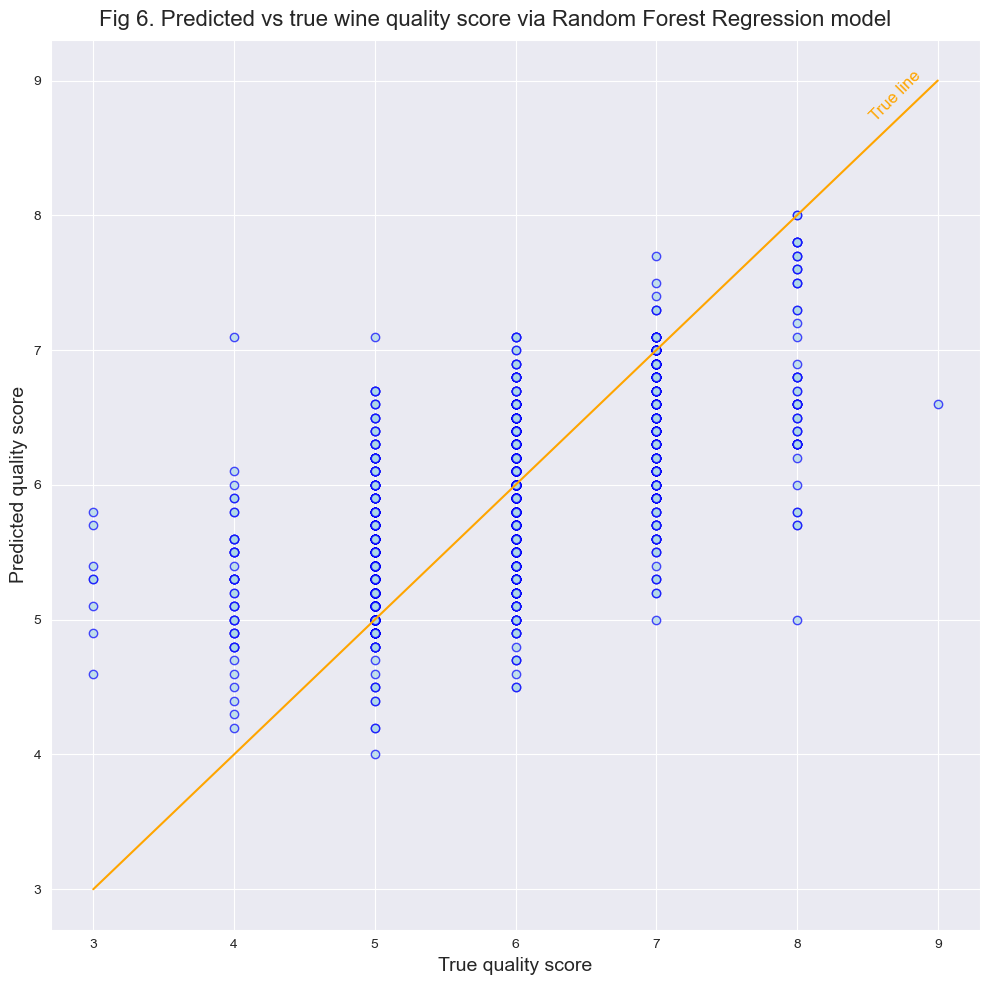

In [1280]:
plt.figure(figsize=(10, 10))

# take min and max quality scores available in test data
min_y = min(y_test.min(), rf_test_pred.min())
max_y = max(y_test.max(), rf_test_pred.max())

# plot scatter plot of actual vs true value of quality score obtained via the model
plt.scatter(y_test,rf_test_pred,alpha=0.7, color='lightblue', edgecolor='blue')
# draw true line using min and max we found earlier
plt.plot([min_y, max_y], [min_y, max_y], color='orange')
plt.text(8.5, 8.7,'True line', color='orange', rotation=45, size=12)

# set appropriate axes labels and spacings
plt.ylabel('Predicted quality score', size=14)
plt.xlabel('True quality score', size=14)
plt.suptitle('Fig 6. Predicted vs true wine quality score via Random Forest Regression model', size=16)
plt.tight_layout()
plt.show()

**Observations (Fig 6.):**

* The plot shows actual vs predicted values of wine quality score ranging from 3 to 9 in the test data.
* For the data in the middle, we can see more points occuring around the true quality line. This is not the case for highest (score 3 and 4) and lowest (score 9) ends. Therefore, the model predicts better when score is around median.
* Even then we can see that for these scores, many of the predicted values are scattered and they can be as off from actual values as 2 scores.
* For extreme ends, this difference is more than 4.
* We can say that the model is not very good for predicting wine quality from the result. We may have to increase the number of trees to get better predictions.
* For true extreme values, actual values show high variation such as more than 2 scores away from actual values, which, even though the value is small, can be considered high with respect to the range of values available for scoring.
* Many of the predicted value against all actual values are centered around the middle between scores 4 and 7 showing a high bias in this region.

##### Assess the performance of a random forest regression model with 5, 10, 50, 100, 500, 1000, and 5000 trees in predicting the quality of a wine. Create a plot of the model performance as a function of the number of trees (useing log axis for the number of trees).

In [ ]:
# Store number of trees in list for looping through
num_of_trees = [5, 10, 50, 100, 500, 1000, 5000]

 # standard error for each number of trees.
sd_error = [] 
# mean of RSS (MSE) of each state for each number of trees.
mean_rss = []  

for n in num_of_trees:
    rss_of_states = []  # store RSS of each state
    # fit model 20 times - use i as random_state
    for i in range(1,21): 
        # fit model using current number of trees 'n', n_jobs =-1 to run code faster on multiple cores
        rf = RandomForestRegressor(n_estimators=n, random_state=i, n_jobs=-1) 
        # train the model using train sets we had created earlier
        rf.fit(X_train, y_train)
        # predict quality using test set
        rf_test_pred = rf.predict(X_test) # predict
        # calculate rss and add to list to see performance
        rss = np.mean(pow((rf_test_pred - y_test),2)) 
        rss_of_states.append(rss)
    
    # Calculate mean and standard error of RSS
    mean_rss.append(np.mean(rss_of_states))
    # standard error is standard deviation by square root of n
    sd_error.append(np.std(rss_of_states) / np.sqrt(20)) # because n=20 

# Plot number of trees against mean RSS
plt.figure(figsize=(10, 15))
# add errorbar to view standard error in red
plt.errorbar(num_of_trees, mean_rss, yerr=sd_error, label='Standard error', color='red', ecolor='red', linestyle='None', capsize=5)
# view model performance via mean RSS.
plt.plot(num_of_trees, mean_rss, 'o-', label='Mean RSS', color='darkgreen')
plt.legend()
plt.ylabel('Mean RSS value', size=14)
plt.xlabel('Number of trees in random forest', size=14)
plt.title('Fig 7. Model Performance as function of number of trees', size=18)
plt.grid(True, which="both")
plt.xscale('log') #log scale for number of trees on x axis
plt.show()




**Observations (Fig 7.):**

* From the fugure, it is very clear that as number of trees in random forest k increase, the mean RSS get reduced considerably and model performance improves by a lot.
* The standard error also shows the same trend. We can see when number of trees is higher than 100, the model reaches a stable state with less mean RSS and much lesser variations in predictions.
* An optimal number of trees in the model for better performance would be 100-500.


##### Rationale for fitting the model multiple times with different random states.

* Fitting model multiple times using various random states help us to evaluate performance better, by averaging out model's randomness.
* Random forests uses random sampling of training data to create trees.
* If we do only a single run, we might get an output that is good or bad due to chance, i.e., we may underfit or overfit based on the splitting of the data.
* Hence, fitting the model several times will help us test across multiple random states more like real-world problems and provide us with a more reliable result.
* It will help us get a better insight about average performance of the model and compute the standard error as well.

#### Clustering algorithms to identify different wine groups

##### Perform a k-means cluster analysis, using the indicators as the features. Run the clustering algorithm for different numbers of clusters (integers from 1 to 10). Plot the model performance as a function of the number of clusters and identify the optimal number of clusters for this data.

* We will use sum of squared error (SSE) again as the parameter to determine model performance.

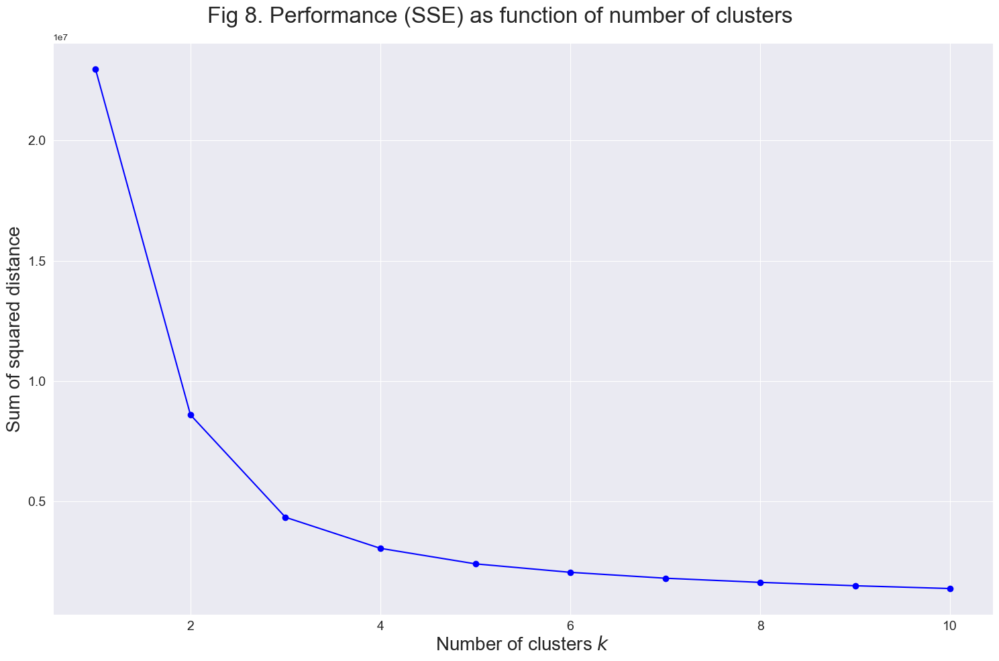

In [ ]:
# create a copy of X (non standardised) to mark cluster later
X_k_means = X.copy()
# create SSE empty list for storing sum of squared errors.
sse = []

# run the model for 1-10 number of clusters given by range as shown below
for k in range(1, 11):
    # use KMeans() from sklearn.cluster for the clustering
    km = KMeans(n_clusters=k,n_init=10)
    # provide 11 predictor feature variables - quality excluded
    km.fit(X_k_means)
    # sse can be extracted from inertia_ metric obtained from model
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(15, 10))
plt.plot(range(1, 11), sse, '-o', color='blue')
plt.ylabel('Sum of squared distance', fontsize=20)
plt.xlabel(r'Number of clusters $k$', fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.suptitle('Fig 8. Performance (SSE) as function of number of clusters', fontsize=24)
plt.tight_layout()
plt.show()

**Observations (Fig 8.):**

* This is a plot of number of clusters against SSE (inertia) and this method is called elbow method.
* For optimal k, we need to choose value where 'a sharp elbow' occures ie, apoint after which SSE reduction decreases.
* By this method, we can see optimal number of clusters is around 3-4 after SSE drop reduces and stabilizes after a point.
* Overall, from the figure, we can see that as number of clusters increases, SSE reduces. When number of clusters is 1, SSE is highest.
* For the k-means analysis we will use **optimim value of k which is 3** (first occurence of a point after significant reduction).


##### Perform a k-means cluster analysis, using the optimal number of clusters identified earlier, and identify the most discriminatory variables.

* From part(a), optimal number of clusters was found to be 3 (k=3).

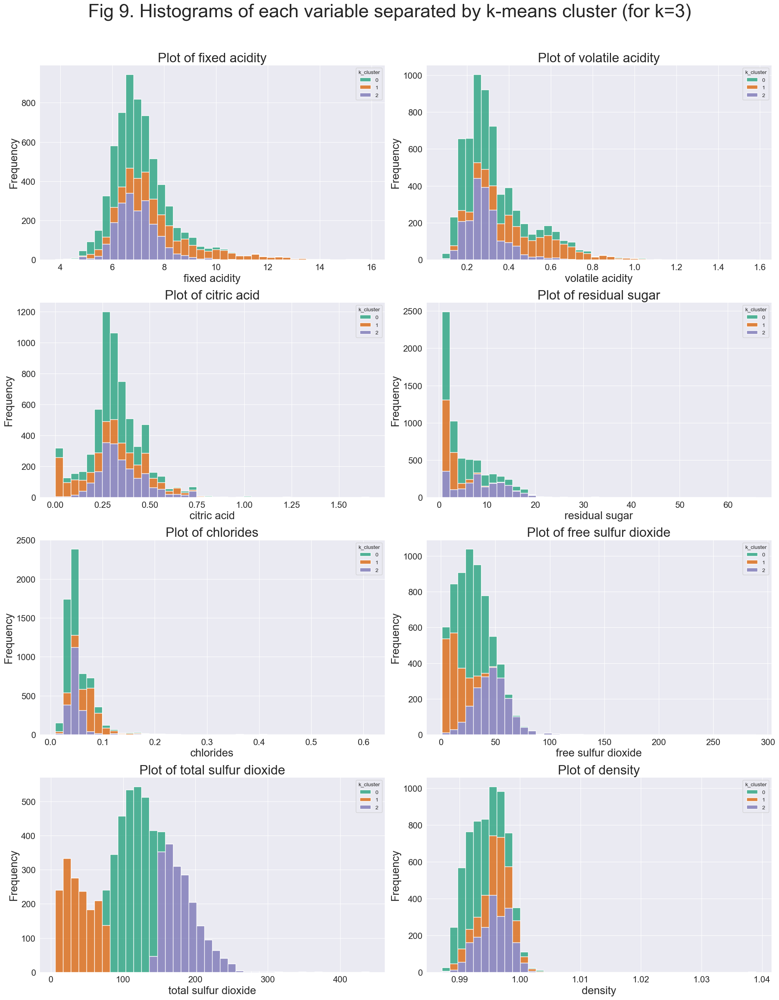

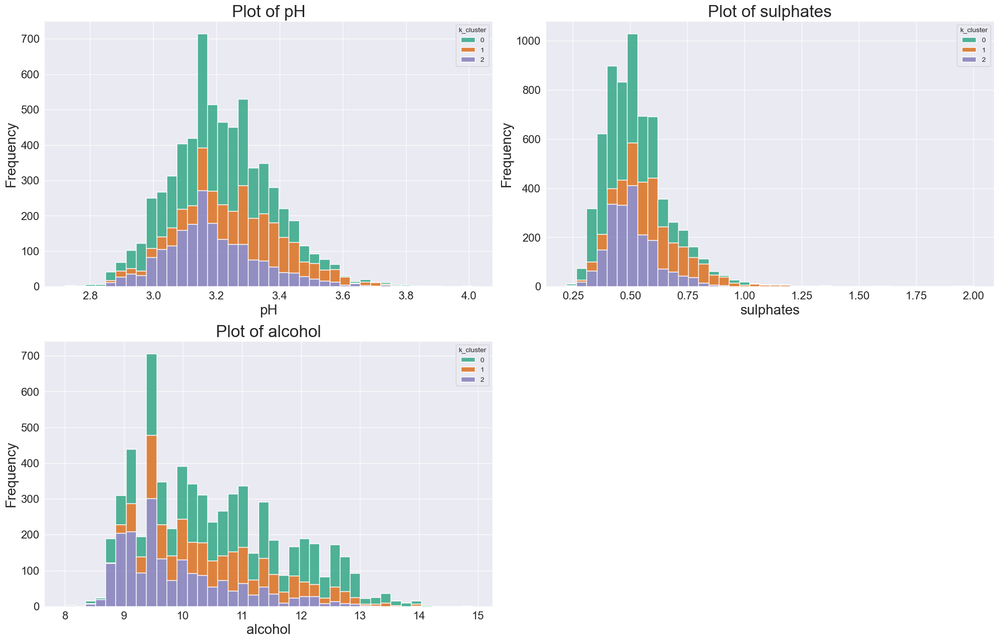

In [ ]:
figsize_plot=(20, 25)
plt.figure(figsize=figsize_plot)
plt.suptitle('Fig 9. Histograms of each variable separated by k-means cluster (for k=3)', fontsize=34, y=1.02)

# use k=3 as number of clusters (n_clusters). Set random state for reproducability
model = KMeans(n_clusters=3, n_init=10, random_state=101)
# create a new column to label the observations based on the k clustering count (to be used as hue in plot)
X_k_means['k_cluster'] = model.fit_predict(X_k_means)
# get list of indicators alone for plotting
indicators = X_k_means.columns.drop('k_cluster') 

i = 1 # subplot index
for var in indicators:
    # we will split the plot to multiple figures for readability
    if i > 8: # not more than 8 subplots in a fugure
            plt.figure(figsize=figsize_plot) 
            i = 1
    # dynamic subplot indexing
    plt.subplot(4,2,i)
    # create histogram using hue as cluster name to separate them based on k means clustering
    sns.histplot(data=X_k_means, x=var, hue='k_cluster', bins=40, multiple='stack', palette='Dark2')
    plt.title(f'Plot of {var}',fontsize=24)
    plt.ylabel('Frequency',fontsize=20)
    plt.xlabel(var, fontsize=20)
    plt.yticks(fontsize=16)
    plt.xticks(fontsize=16)
    plt.tight_layout()
    i=i+1

plt.show()


**Observations (Fig 9.):**

* From the figure, we can see the 3 clusters in k-means clustering are labelled as 0,1 and 2.
* It is very evident from the figure that total sulfur dioxide is the most discriminatory variable in all the 11 indicators, with clear separation between the clusters.
* The second most discriminatory variable is free sulfur dioxide.
* Density is also one of the most discriminatory variables among the set.
* It was observed that these variables had erlier occured among most correlated pairs, showing a relation of how clustering  groups based on similarity of variables.


##### Create a series of scatter plots for the most discriminatory variables, colouring the points by cluster number.

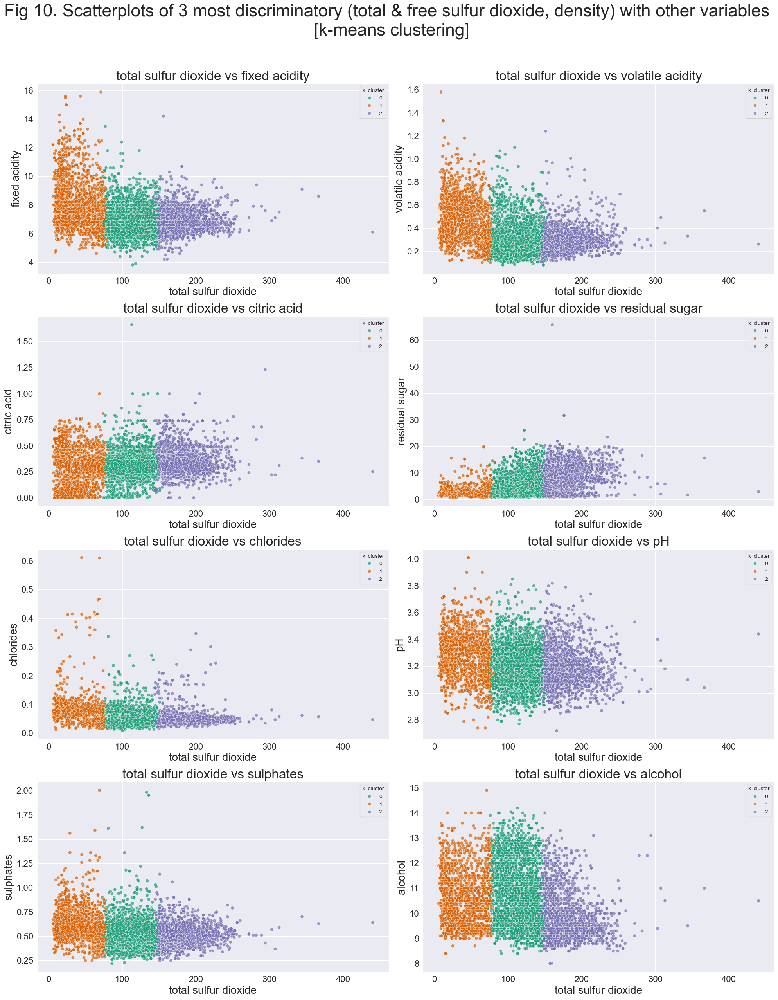

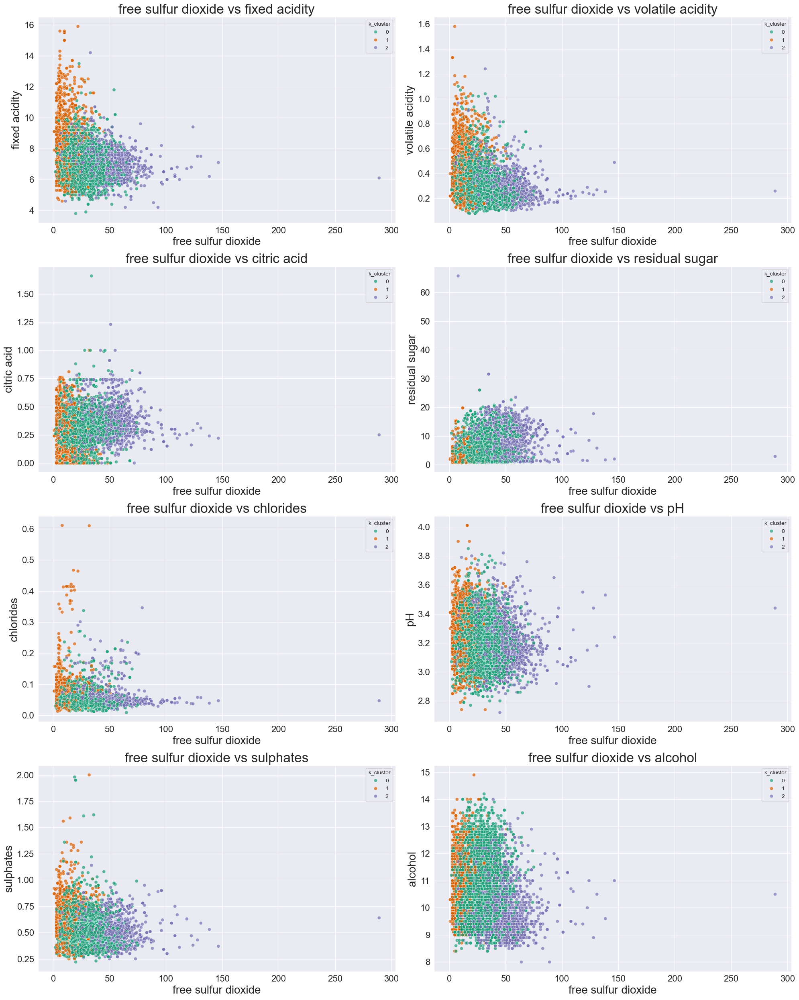

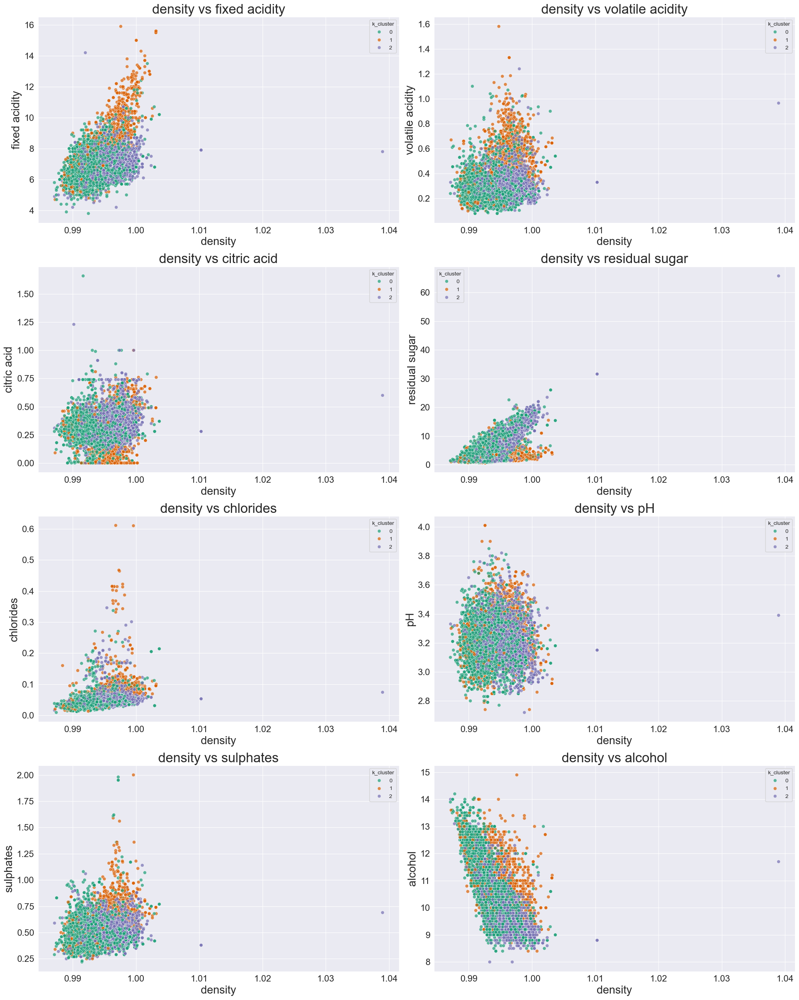

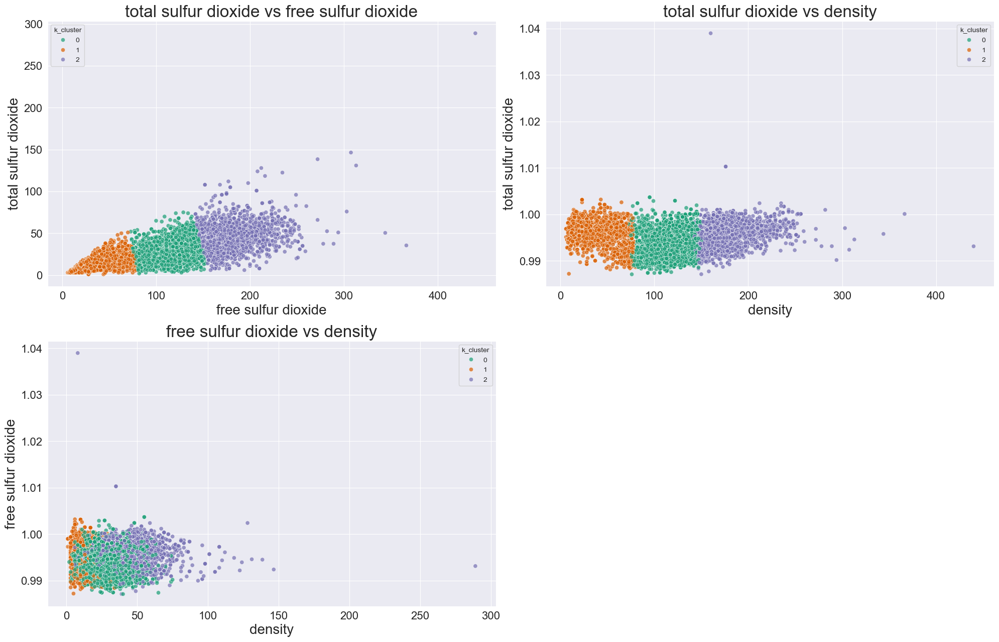

In [ ]:
figsize_plot=(20, 25)
plt.figure(figsize=figsize_plot)
plt.suptitle('Fig 10. Scatterplots of 3 most discriminatory (total & free sulfur dioxide, density) with other variables \n [k-means clustering]', fontsize=32,y=1.02)

# 3 most disciminatory variables found from above histograms:
selected_variables_k_means = ['total sulfur dioxide', 'free sulfur dioxide','density']
# get a list of other variables to plot against
all_variables = X_k_means.columns.drop(['k_cluster'])
other_variables = [var for var in all_variables if var not in selected_variables_k_means]

i=1 #plot index

# create scatter plots for discriminatory and other variables
for var1 in selected_variables_k_means:
    for var2 in other_variables:
        # not more than 8 plots in one figure for the purpose of readability
        if i > 8:
            plt.figure(figsize=figsize_plot) 
            i = 1  # suplot index
        
        plt.subplot(4,2,i)
        # use scatterplot from seaborn package
        sns.scatterplot(data=X_k_means, x=var1, y=var2, hue='k_cluster', palette='Dark2',alpha=0.7)
        plt.ylabel(var2, fontsize=20)
        plt.xlabel(var1, fontsize=20)
        plt.yticks(fontsize=16)
        plt.xticks(fontsize=16)
        plt.title(f'{var1} vs {var2}', fontsize=24)
        plt.tight_layout()
        i=i+1

plotted_list = [] # list to check if already plotted or not

# create scatterplots of discriminatory variables within each other
for var1 in selected_variables_k_means:
    for var2 in selected_variables_k_means:
        if var1 != var2: # make sure not to self plot same variables
            var_tuple = tuple(sorted([var1, var2]))
            if var_tuple in plotted_list:
                continue  # skip loop if variables already plotted
            plotted_list.append(var_tuple)
            if i > 8:
                plt.figure(figsize=figsize_plot)
                i = 1

            plt.subplot(4,2,i)
            # use scatterplot from seaborn package
            sns.scatterplot(data=X_k_means, x=var1, y=var2, hue='k_cluster', palette='Dark2', alpha=0.7)
            plt.ylabel(var1, fontsize=20)
            plt.xlabel(var2, fontsize=20)
            plt.yticks(fontsize=16)
            plt.xticks(fontsize=16)
            plt.title(f'{var1} vs {var2}', fontsize=24)
            plt.tight_layout()
            i+=1

plt.show()


**Observations (Fig 10.):**

**Discriminatory variables:**

**1. Total sulfur dioxide**

  - Clusters are well identifiable, with very little overlap. 
  - The plots show that total sulfur dioxide has a high role as discriminatory variable as it creates good cluster separations.
  - Volatile and fixed acidity show similar cluster densities.
  - The orange cluster (cluster 0) represents lower total sulfur dioxide and the blue cluster (cluster 2) represents higher total sulfur dioxide values in all subplots.
  - The plots are as expected from the result of histogram.
  - We had seen total sulfur dioxide had occurred in highly correlated pairs before. This also shows some relation of clustering to correlation.

**2. Free sulfur dioxide**

  - Clusters are less distinguishable compared to total sulfur dioxide with more cluster overlapping. 
  - Still we can identify clusters sufficiently.
  - Green and blue clusters (clusters 1 & 2) dominate the graph.
  - The cluster ordering is similar to total suplhur dioxide.

**3. Density**

  - Density has a moderate role as discriminatory variable and there is good amount of overlap between clusters.
  - We can see varying shapes compared to previous two discriminatory variable.
  - Here also density of orange cluster (cluster 0) is less just like free sulfur dioxide.


##### Spectral clustering vs k-means cluster analysis

* Spectral clustering works by creating a similarity graph based on data points.

* For the wine dataset, Spectral clustering might be good because as we have seen, the various indicators correlate a lot with each other.

* Spectral Clustering works best for data where multiple relationships need to be explored (including non linear) and in our case we will use the relations in our dataset to cluster wines in a more natural technique compared to k-means clustering which assumes indicators are very well separated. It also works better with fewer clusters.
Some applications include image segmentation.

* `discretize` has been used as to assign labels to clusters after it is divided instead of `kmeans` to use a different method that doesn't depend on proximity to centre points. Discretization is less sensitive to random initialization.

* k nearest neighbors method has been used to check similarity based on Euclidean distance and cluster the points. The use of Euclidean distance is similar to k means. However, k-means is a more simpler clustering which starts with random cluster centres and keeps adding points to the closest center (the centers are updated each time). Spectral clustering needs to create the similarity graph or affinity matrix. 

* We will also use Silhouette score that maximizes cluster separation compared to reduction of SSE in case of elbow method. This helps use to obtain a quantitative score rather than finding optimal number of clusters from plot itself. 

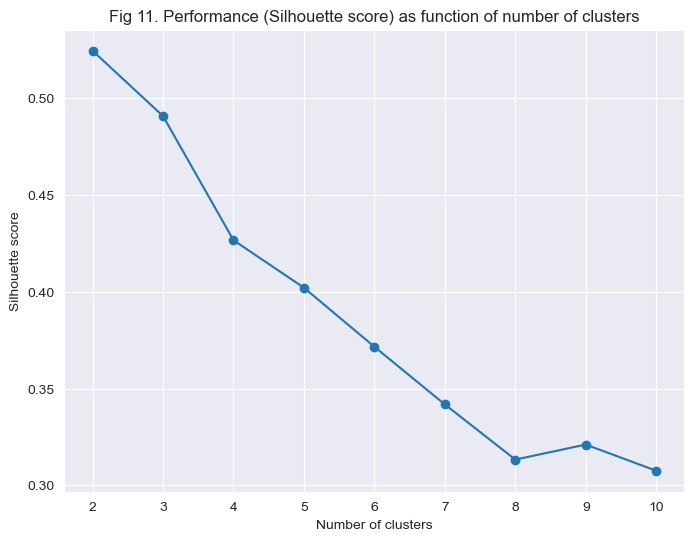

Optimal number of clusters - 2


In [ ]:
X_spectral = X.copy()

silhouette = [] # to store silhouette scores

for n_clusters in range(2, 11): ## silhoutte scoring starting from 2
    # use SpectralClustering from sklearn.cluster, n_neighbors 10 by default
    spectral = SpectralClustering(n_clusters=n_clusters, assign_labels="discretize", 
                                  affinity="nearest_neighbors", random_state=42)
    # fit the model
    labels = spectral.fit_predict(X_spectral)

    # add silhoutte score value
    silhouette.append(silhouette_score(X_spectral, labels))

# Plot performance
plt.figure(figsize=(8, 6))
plt.plot(range(2, 11), silhouette, marker='o')
plt.ylabel('Silhouette score')
plt.xlabel('Number of clusters')
plt.title('Fig 11. Performance (Silhouette score) as function of number of clusters')
plt.show()

# Find highest silhouette score
optimal_n_clusters = range(2, 11)[silhouette.index(max(silhouette))]
print(f"Optimal number of clusters - {optimal_n_clusters}")



**Observations (Fig 11.):**

* We already received optimal number of clusters as 2 from silhouette score.
* For model selection highest silhoutte score is preferred.
* Hence, we can see from graph that this point is 2.

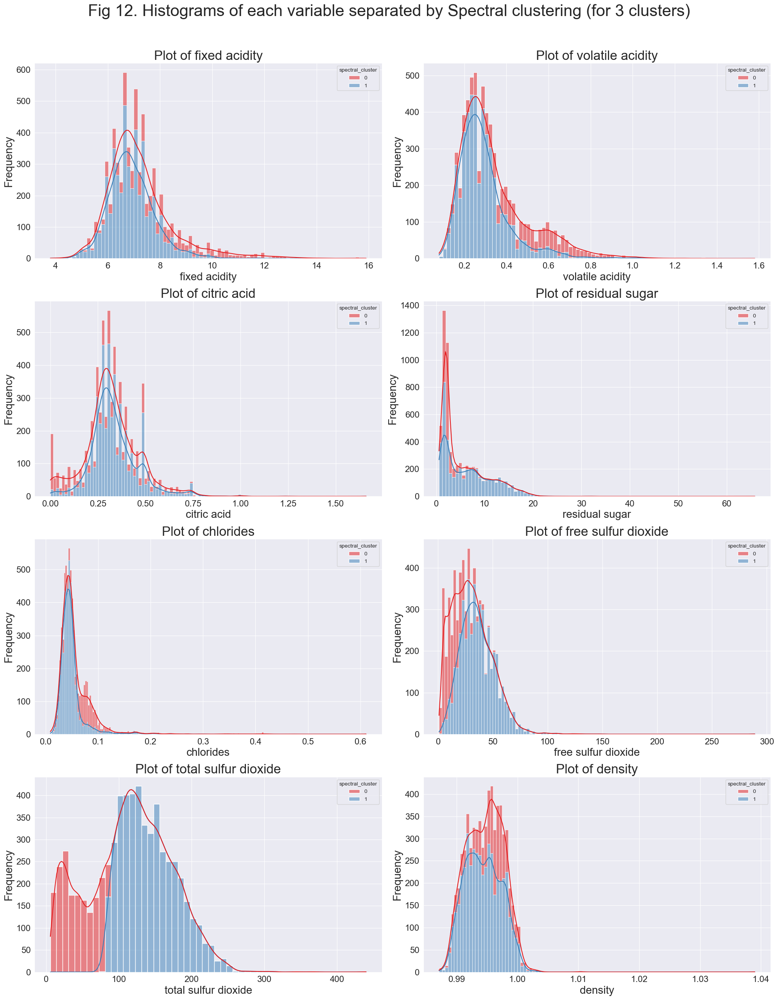

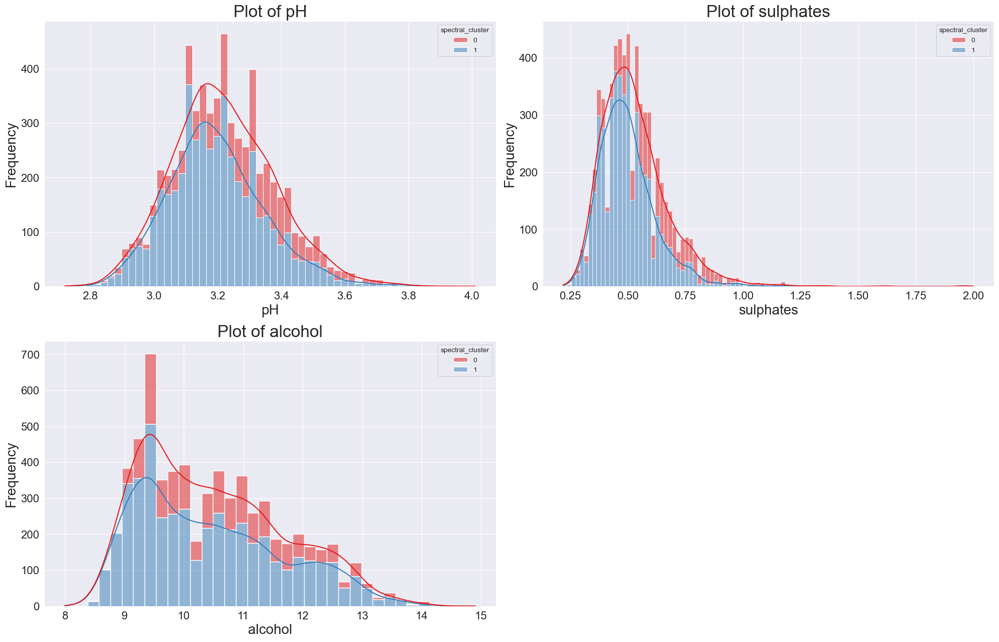

In [ ]:
figsize_plot=(20, 25)
plt.figure(figsize=figsize_plot)
plt.suptitle('Fig 12. Histograms of each variable separated by Spectral clustering (for 3 clusters)', fontsize=30, y=1.02)

# optimal number of clusters was found to be 2
model2 = SpectralClustering(n_clusters=2, assign_labels="discretize", random_state=42, affinity="nearest_neighbors")
X_spectral['spectral_cluster'] = model2.fit_predict(X_spectral)
indicators = X_spectral.columns.drop('spectral_cluster')  

i = 1 # subplot index
for var in indicators:
    if i > 8:
            plt.figure(figsize=figsize_plot) 
            i = 1

    plt.subplot(4,2,i)
    # create kde enhanced histogram by using spectral clustering as separation.
    sns.histplot(data=X_spectral, x=var, hue='spectral_cluster', kde=True, multiple='stack', palette='Set1')
    plt.title(f'Plot of {var}',fontsize=24)
    plt.ylabel('Frequency',fontsize=20)
    plt.xlabel(var, fontsize=20)
    plt.yticks(fontsize=16)
    plt.xticks(fontsize=16)
    plt.tight_layout()
    i=i+1
    
plt.show()

**Observations (Fig 12.):**

* It can be seen from the graph that the most discriminatory variables turned out to be same as that which we saw in k-means method.
* The three most distinguishable variables are total sulfur dioxide, free sulfur dioxide and density in that order.
* The similarity in finding the most discriminatory variables with k-means show how the fundamental partitioning technique can affect clustering (Euclidean distance used in both for clustering).

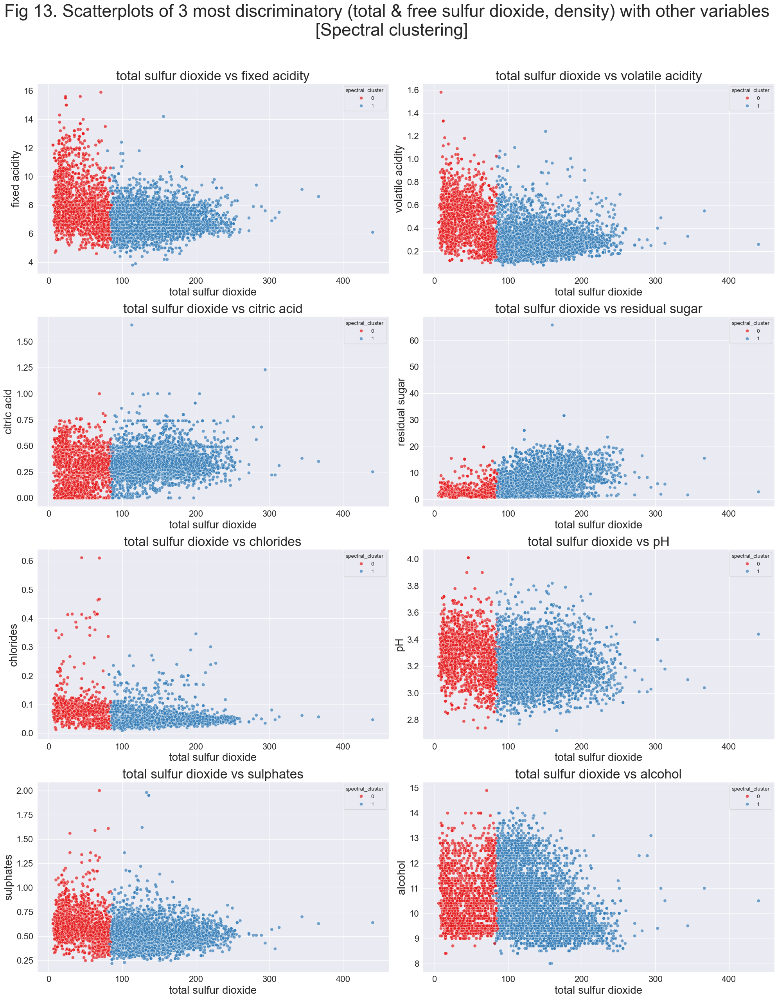

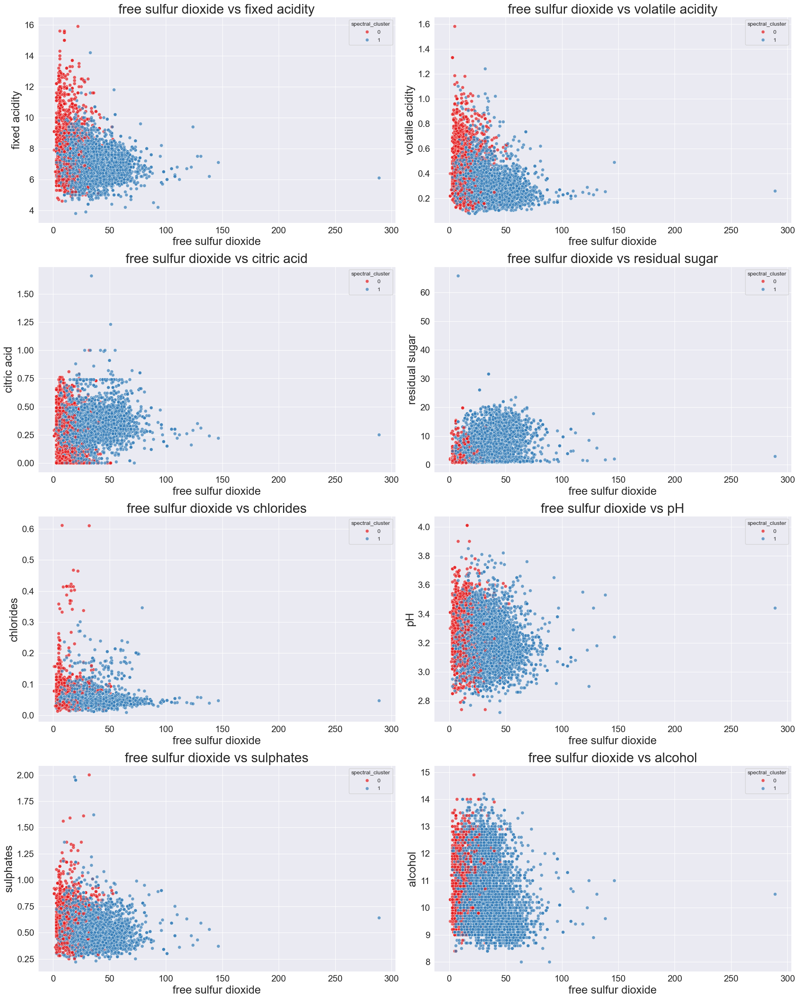

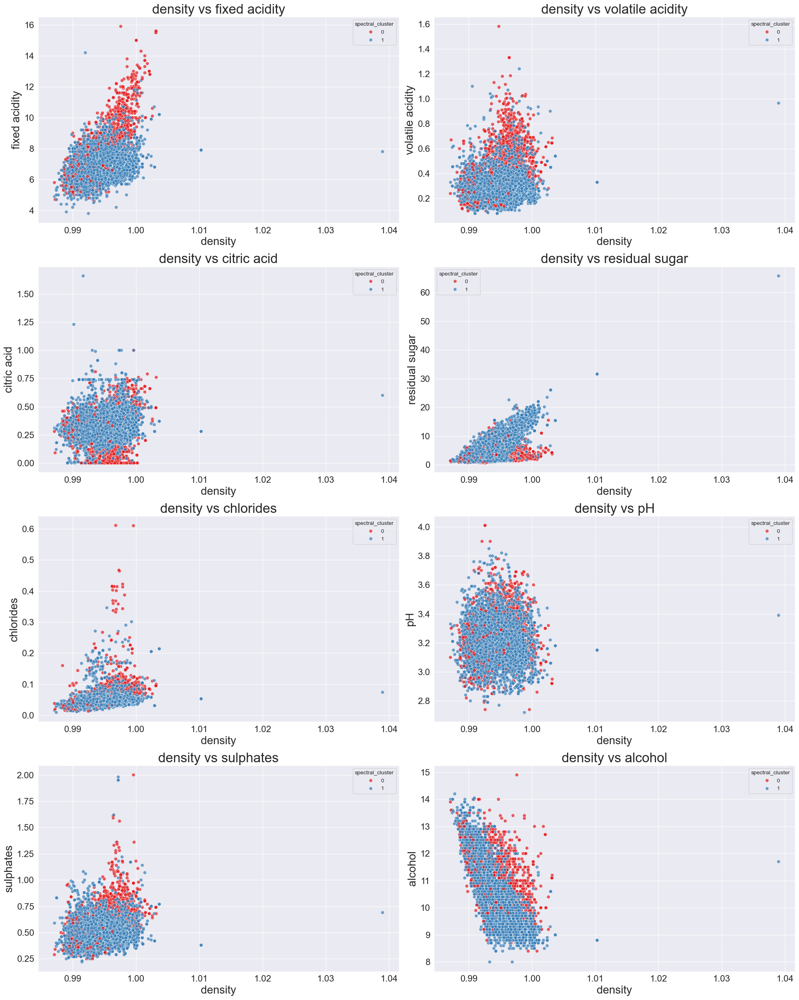

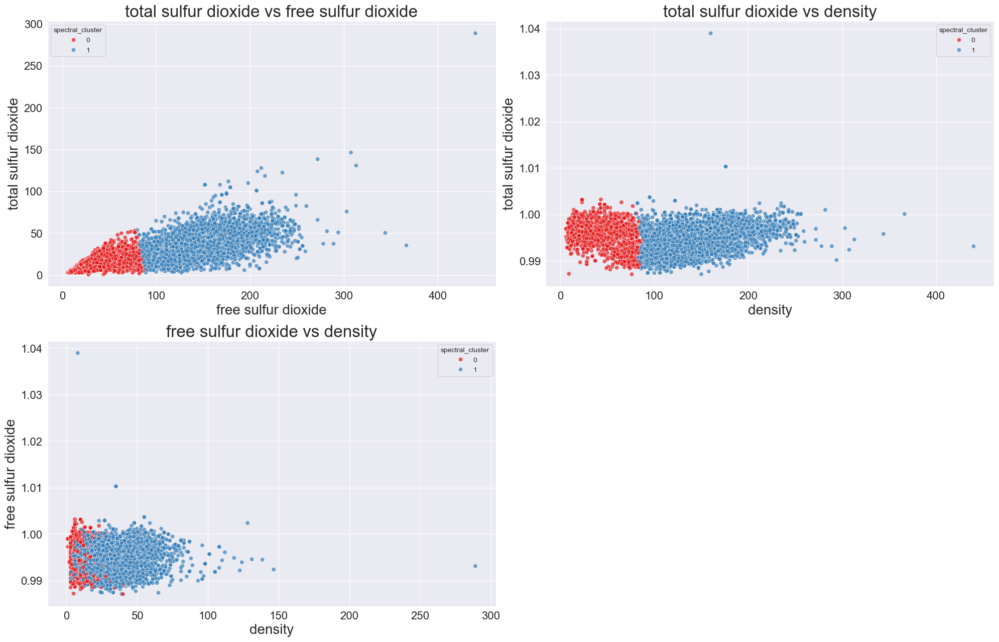

In [ ]:
figsize_plot=(20, 25)
plt.figure(figsize=figsize_plot)
plt.suptitle('Fig 13. Scatterplots of 3 most discriminatory (total & free sulfur dioxide, density) with other variables \n [Spectral clustering]', fontsize=32,y=1.02)

# most disciminatory variables found from above histograms
selected_variables_spectral = ['total sulfur dioxide', 'free sulfur dioxide', 'density']
all_variables = X_spectral.columns.drop(['spectral_cluster'])
other_variables = [var for var in all_variables if var not in selected_variables_spectral]

i=1  # plot index

# create scatter plots for discriminatory and other variables
for var1 in selected_variables_spectral:
    for var2 in other_variables:
        #new plot after 8 plots in figure to fit page properly:
        if i > 8:
            plt.figure(figsize=figsize_plot) 
            i = 1  # suplot index
        
        plt.subplot(4,2,i)
        sns.scatterplot(data=X_spectral, x=var1, y=var2, hue='spectral_cluster', palette='Set1', alpha=0.7)
        plt.ylabel(var2, fontsize=20)
        plt.xlabel(var1, fontsize=20)
        plt.yticks(fontsize=16)
        plt.xticks(fontsize=16)
        plt.title(f'{var1} vs {var2}', fontsize=24)
        plt.tight_layout()
        i+=1

plotted_list = [] # list to check if already plotted or not

# create scatterplots of discriminatory variables within each other
for var1 in selected_variables_spectral:
    for var2 in selected_variables_spectral:
        if var1 != var2: # make sure not to self plot same variables
            var_tuple = tuple(sorted([var1, var2]))
            if var_tuple in plotted_list:
                continue  # skip loop if variables already plotted
            plotted_list.append(var_tuple)
            if i > 8:
                plt.figure(figsize=figsize_plot)
                i = 1

            plt.subplot(4,2,i)
            sns.scatterplot(data=X_spectral, x=var1, y=var2, hue='spectral_cluster', palette='Set1', alpha=0.7)
            plt.ylabel(var1, fontsize=20)
            plt.xlabel(var2, fontsize=20)
            plt.yticks(fontsize=16)
            plt.xticks(fontsize=16)
            plt.title(f'{var1} vs {var2}', fontsize=24)
            plt.tight_layout()
            i+=1

plt.show()

**Observations (Fig 13.):**

* The clustering shape of red cluster (cluster 0) is very similar to orange cluster (cluster 0) in k-means clustering.
* We can see that there is a distribution difference between the clusters (which was not the case for k-means).
* Cluster 1 (blue) has a much larger size than cluster 0 (red) in all cases.
* All other observations are similar such as :

  - Total sulfur dioxide has clusters that are well identifiable, with very little overlap. 
  - Free sulfur dioxide has clusters that are less distinguishable compared to total sulfur dioxide with more cluster overlapping. 
  - Density as good amount of overlap between clusters.

* This similarity once again shows how the fundamental clustering techniques of both algorithms are similar, as both uses Euclidean distance method for clustering data.

**References:**

* UCD ecture notes
* https://scikit-learn.org/stable/modules/clustering.html (Spectral clustering)